# Lab | Customer Analysis Round 6

For this lab, we still keep using the marketing_customer_analysis.csv file that you can find in the files_for_lab folder.

## Get the data

We are using the marketing_customer_analysis.csv file.

In [320]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats
import os

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error

import warnings
warnings.filterwarnings('ignore')

pd.options.display.max_columns = None


In [321]:
data = pd.read_csv(r"C:\Users\anton\Ironhack\Week2\Day3\lab-customer-analysis-round-6\files_for_lab\csv_files\marketing_customer_analysis.csv")

In [322]:
data.head()

,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


In [323]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9134 entries, 0 to 9133
Data columns (total 24 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Customer                       9134 non-null   object 
 1   State                          9134 non-null   object 
 2   Customer Lifetime Value        9134 non-null   float64
 3   Response                       9134 non-null   object 
 4   Coverage                       9134 non-null   object 
 5   Education                      9134 non-null   object 
 6   Effective To Date              9134 non-null   object 
 7   EmploymentStatus               9134 non-null   object 
 8   Gender                         9134 non-null   object 
 9   Income                         9134 non-null   int64  
 10  Location Code                  9134 non-null   object 
 11  Marital Status                 9134 non-null   object 
 12  Monthly Premium Auto           9134 non-null   i

## Dealing with the data

Already done in the round 2.

In [324]:
#show shape of data frame
data.shape

(9134, 24)

In [325]:
#show columns
data.columns

Index(['Customer', 'State', 'Customer Lifetime Value', 'Response', 'Coverage',
       'Education', 'Effective To Date', 'EmploymentStatus', 'Gender',
       'Income', 'Location Code', 'Marital Status', 'Monthly Premium Auto',
       'Months Since Last Claim', 'Months Since Policy Inception',
       'Number of Open Complaints', 'Number of Policies', 'Policy Type',
       'Policy', 'Renew Offer Type', 'Sales Channel', 'Total Claim Amount',
       'Vehicle Class', 'Vehicle Size'],
      dtype='object')

In [326]:
# standardize the columns
data.columns = [column.lower().replace(' ', '_') for column in data.columns]

In [327]:
#check columns
data.columns

Index(['customer', 'state', 'customer_lifetime_value', 'response', 'coverage',
       'education', 'effective_to_date', 'employmentstatus', 'gender',
       'income', 'location_code', 'marital_status', 'monthly_premium_auto',
       'months_since_last_claim', 'months_since_policy_inception',
       'number_of_open_complaints', 'number_of_policies', 'policy_type',
       'policy', 'renew_offer_type', 'sales_channel', 'total_claim_amount',
       'vehicle_class', 'vehicle_size'],
      dtype='object')

In [328]:
#check null values per column
data.isna().sum()

customer                         0
state                            0
customer_lifetime_value          0
response                         0
coverage                         0
education                        0
effective_to_date                0
employmentstatus                 0
gender                           0
income                           0
location_code                    0
marital_status                   0
monthly_premium_auto             0
months_since_last_claim          0
months_since_policy_inception    0
number_of_open_complaints        0
number_of_policies               0
policy_type                      0
policy                           0
renew_offer_type                 0
sales_channel                    0
total_claim_amount               0
vehicle_class                    0
vehicle_size                     0
dtype: int64

## Explore the data

Done in the round 3.

In [329]:
#categoricals
cat = data.select_dtypes('object')
cat

,customer,state,response,coverage,education,effective_to_date,employmentstatus,gender,location_code,marital_status,policy_type,policy,renew_offer_type,sales_channel,vehicle_class,vehicle_size
0,BU79786,Washington,No,Basic,Bachelor,2/24/11,Employed,F,Suburban,Married,Corporate Auto,Corporate L3,Offer1,Agent,Two-Door Car,Medsize
1,QZ44356,Arizona,No,Extended,Bachelor,1/31/11,Unemployed,F,Suburban,Single,Personal Auto,Personal L3,Offer3,Agent,Four-Door Car,Medsize
2,AI49188,Nevada,No,Premium,Bachelor,2/19/11,Employed,F,Suburban,Married,Personal Auto,Personal L3,Offer1,Agent,Two-Door Car,Medsize
3,WW63253,California,No,Basic,Bachelor,1/20/11,Unemployed,M,Suburban,Married,Corporate Auto,Corporate L2,Offer1,Call Center,SUV,Medsize
4,HB64268,Washington,No,Basic,Bachelor,2/3/11,Employed,M,Rural,Single,Personal Auto,Personal L1,Offer1,Agent,Four-Door Car,Medsize
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,California,No,Basic,Bachelor,2/10/11,Employed,M,Urban,Married,Personal Auto,Personal L1,Offer2,Web,Four-Door Car,Medsize
9130,PK87824,California,Yes,Extended,College,2/12/11,Employed,F,Suburban,Divorced,Corporate Auto,Corporate L3,Offer1,Branch,Four-Door Car,Medsize
9131,TD14365,California,No,Extended,Bachelor,2/6/11,Unemployed,M,Suburban,Single,Corporate Auto,Corporate L2,Offer1,Branch,Four-Door Car,Medsize
9132,UP19263,California,No,Extended,College,2/3/11,Employed,M,Suburban,Married,Personal Auto,Personal L2,Offer3,Branch,Four-Door Car,Large


In [330]:
# check uniques in categoricals -> already cleaned
for column in cat.columns:
    print(column, cat[column].unique())

customer ['BU79786' 'QZ44356' 'AI49188' ... 'TD14365' 'UP19263' 'Y167826']
state ['Washington' 'Arizona' 'Nevada' 'California' 'Oregon']
response ['No' 'Yes']
coverage ['Basic' 'Extended' 'Premium']
education ['Bachelor' 'College' 'Master' 'High School or Below' 'Doctor']
effective_to_date ['2/24/11' '1/31/11' '2/19/11' '1/20/11' '2/3/11' '1/25/11' '1/18/11'
 '1/26/11' '2/17/11' '2/21/11' '1/6/11' '2/6/11' '1/10/11' '1/17/11'
 '1/5/11' '2/27/11' '1/14/11' '1/21/11' '2/5/11' '1/29/11' '2/28/11'
 '2/12/11' '2/2/11' '2/7/11' '1/22/11' '2/13/11' '1/15/11' '1/8/11'
 '1/11/11' '1/28/11' '2/8/11' '2/23/11' '1/2/11' '2/16/11' '1/27/11'
 '1/23/11' '1/9/11' '2/11/11' '2/4/11' '2/1/11' '2/15/11' '2/26/11'
 '1/16/11' '1/1/11' '2/10/11' '1/24/11' '2/25/11' '1/12/11' '2/9/11'
 '1/19/11' '1/4/11' '2/14/11' '2/20/11' '2/18/11' '1/3/11' '1/13/11'
 '1/30/11' '2/22/11' '1/7/11']
employmentstatus ['Employed' 'Unemployed' 'Medical Leave' 'Disabled' 'Retired']
gender ['F' 'M']
location_code ['Suburban' 'Rur

In [331]:
#round
data.describe().apply(lambda x: round(x,2)) 

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,total_claim_amount
count,9134.00,9134.00,9134.00,9134.00,9134.00,9134.00,9134.00,9134.00
mean,8004.94,37657.38,93.22,15.10,48.06,0.38,2.97,434.09
std,6870.97,30379.90,34.41,10.07,27.91,0.91,2.39,290.50
min,1898.01,0.00,61.00,0.00,0.00,0.00,1.00,0.10
25%,3994.25,0.00,68.00,6.00,24.00,0.00,1.00,272.26
50%,5780.18,33889.50,83.00,14.00,48.00,0.00,2.00,383.95
75%,8962.17,62320.00,109.00,23.00,71.00,0.00,4.00,547.51
max,83325.38,99981.00,298.00,35.00,99.00,5.00,9.00,2893.24


In [332]:
#select numericals and plot distplots
data.select_dtypes(np.number)

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,total_claim_amount
0,2763.519279,56274,69,32,5,0,1,384.811147
1,6979.535903,0,94,13,42,0,8,1131.464935
2,12887.431650,48767,108,18,38,0,2,566.472247
3,7645.861827,0,106,18,65,0,7,529.881344
4,2813.692575,43836,73,12,44,0,1,138.130879
...,...,...,...,...,...,...,...,...
9129,23405.987980,71941,73,18,89,0,2,198.234764
9130,3096.511217,21604,79,14,28,0,1,379.200000
9131,8163.890428,0,85,9,37,3,2,790.784983
9132,7524.442436,21941,96,34,3,0,3,691.200000


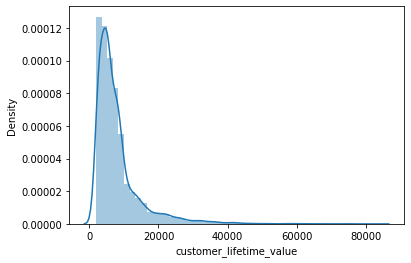

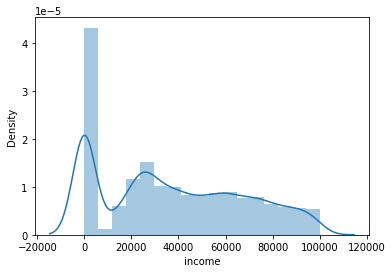

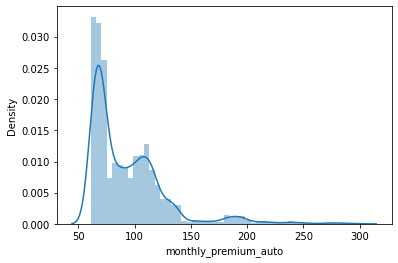

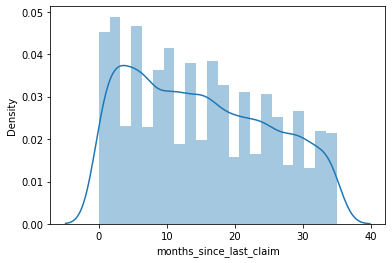

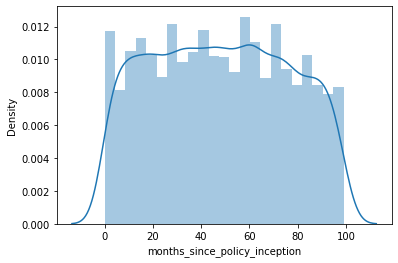

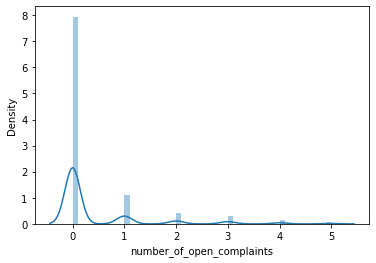

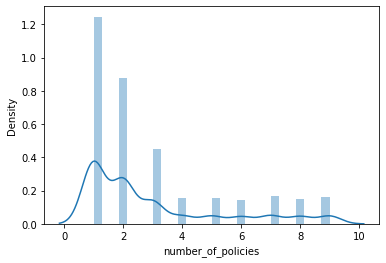

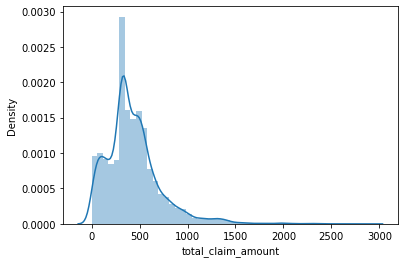

In [333]:
for column in data.select_dtypes(np.number).columns:
    sns.distplot(data[column])
    plt.show()

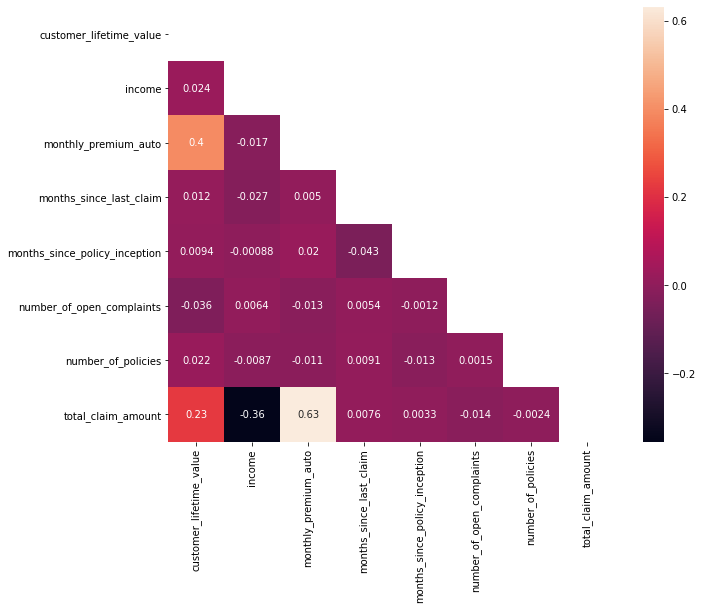

In [334]:
#check correlations 
# check the correlations
mask = np.zeros_like(data.corr())

mask[np.triu_indices_from(mask)] = True # optional, to hide repeat half of the matrix

fig, ax = plt.subplots(figsize=(10, 8))
ax = sns.heatmap(data.corr(), mask=mask, annot=True)
plt.show()
# no correlation above 0,9, no deletion 

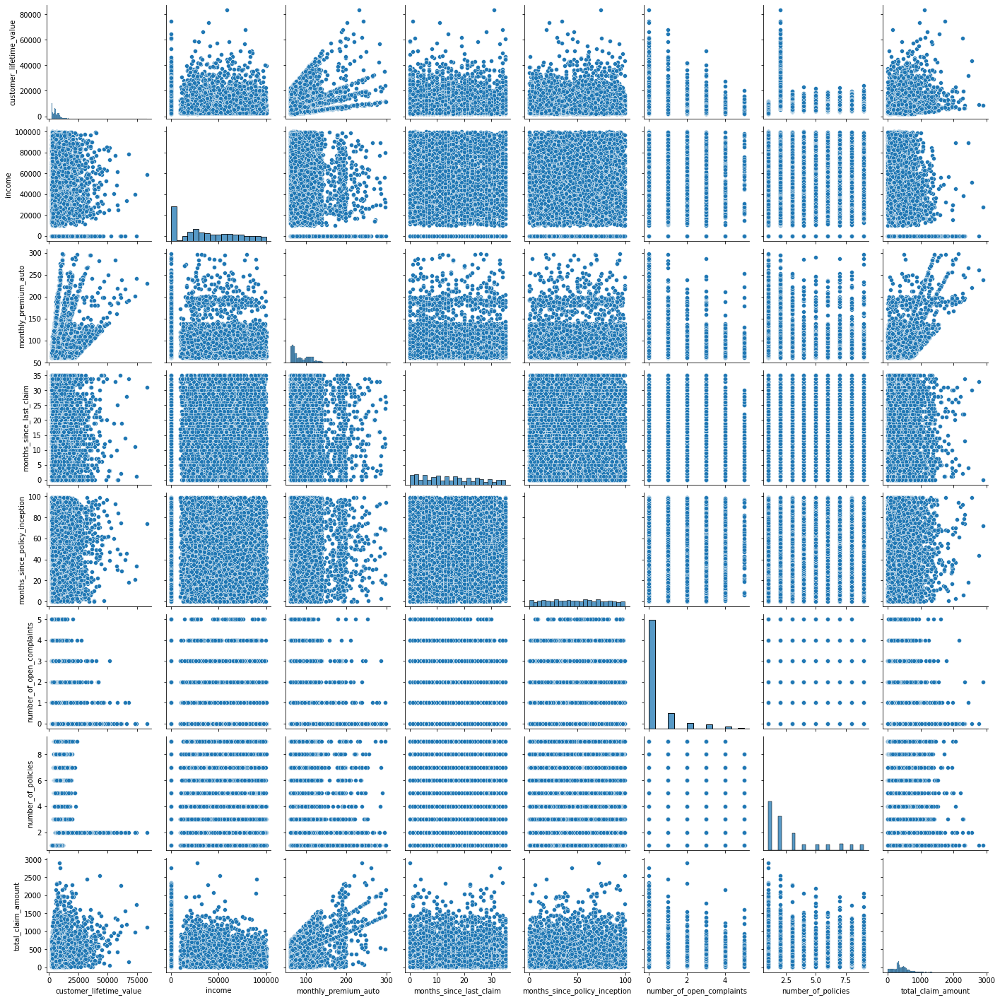

In [335]:
# covariance visualization #compare all numericals 
sns.pairplot(data)

In [336]:
from scipy import stats
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import math
from sklearn.preprocessing import OneHotEncoder, Normalizer, LabelEncoder
from sklearn.model_selection import train_test_split



In [337]:
#copy datadrame and model before normalizing
data_c =data.copy()

c_numbers = data_c.select_dtypes(include=[np.number])
c_objects = data_c.select_dtypes(include=[np.object])

c_x = c_numbers.drop(['total_claim_amount'], axis=1)
c_y = c_numbers['total_claim_amount']

lg = LinearRegression()
modelstart = lg.fit(c_x,c_y)
c_predictions = lg.predict(c_x)
c_rmse = mean_squared_error(c_y, c_predictions, squared=False)

print("R2_score:", round(lg.score(c_x,c_y),2))
print("RMSE:", c_rmse)

c_x = sm.add_constant(c_x)  #add constant
model = sm.OLS(c_y,c_x).fit() #train model

print(model.summary())


R2_score: 0.52
RMSE: 201.53347925902824
                            OLS Regression Results                            
Dep. Variable:     total_claim_amount   R-squared:                       0.519
Model:                            OLS   Adj. R-squared:                  0.518
Method:                 Least Squares   F-statistic:                     1405.
Date:                Thu, 17 Jun 2021   Prob (F-statistic):               0.00
Time:                        13:42:31   Log-Likelihood:                -61425.
No. Observations:                9134   AIC:                         1.229e+05
Df Residuals:                    9126   BIC:                         1.229e+05
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------

In [338]:
# almost all p values of columns are below 0.5; except months_since_policy_inception

In [339]:
#I made a boxcox transformation to normalize the numerical data, but later on I did normalizer and standrizer also. Does this make sense?
def boxcox_transform(data): #give function the the input dataframe df
    numeric_cols = data.select_dtypes(np.number).columns #select numeric columns
    _ci = {column: None for column in numeric_cols} #creating dictionary which contains all columns and none value) key = column name
    for column in numeric_cols:
        # since i know any columns should take negative numbers, to avoid -inf in df
        data[column] = np.where(data[column]<=0, np.NAN, data[column]) #replace all non positive (negative) values with NAN, else keep value as it is
        data[column] = data[column].fillna(data[column].mean()) #whereever I have NAN values now, fill up with mean
        transformed_data, ci = stats.boxcox(data[column])  #boxcox transformation; gives back transformed data and lambda, no choice here
        data[column] = transformed_data #overwriting the colum with transformed data 
        _ci[column] = [ci] #store lambda in dictionary, does not actually make sense but shows that there not only one lambda for all the columns
    return data, _ci  #function return transformed data frame + dictionary with lambda values



In [340]:
data, _ci = boxcox_transform(data)
data

,customer,state,customer_lifetime_value,response,coverage,education,effective_to_date,employmentstatus,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size
0,BU79786,Washington,2.703839,No,Basic,Bachelor,2/24/11,Employed,F,1247.937066,Suburban,Married,0.685347,10.876059,3.017887,0.648045,0.000000,Corporate Auto,Corporate L3,Offer1,Agent,33.035752,Two-Door Car,Medsize
1,QZ44356,Arizona,2.754926,No,Extended,Bachelor,1/31/11,Unemployed,F,1167.961720,Suburban,Single,0.685871,5.808248,18.780377,0.648045,1.424359,Personal Auto,Personal L3,Offer3,Agent,56.357614,Four-Door Car,Medsize
2,AI49188,Nevada,2.780772,No,Premium,Bachelor,2/19/11,Employed,F,1144.063081,Suburban,Married,0.686039,7.347815,17.389171,0.648045,0.607328,Personal Auto,Personal L3,Offer1,Agent,40.071789,Two-Door Car,Medsize
3,WW63253,California,2.759125,No,Basic,Bachelor,1/20/11,Unemployed,M,1167.961720,Suburban,Married,0.686018,7.347815,26.160800,0.648045,1.363462,Corporate Auto,Corporate L2,Offer1,Call Center,38.763252,SUV,Medsize
4,HB64268,Washington,2.704995,No,Basic,Bachelor,2/3/11,Employed,M,1072.375744,Rural,Single,0.685461,5.471294,19.461641,0.648045,0.000000,Personal Auto,Personal L1,Offer1,Agent,19.560154,Four-Door Car,Medsize
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,California,2.801170,No,Basic,Bachelor,2/10/11,Employed,M,1448.531450,Urban,Married,0.685461,7.347815,33.090025,0.648045,0.607328,Personal Auto,Personal L1,Offer2,Web,23.588905,Four-Door Car,Medsize
9130,PK87824,California,2.711030,Yes,Extended,College,2/12/11,Employed,F,697.790558,Suburban,Divorced,0.685606,6.134207,13.709541,0.648045,0.000000,Corporate Auto,Corporate L3,Offer1,Branch,32.792951,Four-Door Car,Medsize
9131,TD14365,California,2.762062,No,Extended,Bachelor,2/6/11,Unemployed,M,1167.961720,Suburban,Single,0.685725,4.379465,17.034934,1.176115,0.607328,Corporate Auto,Corporate L2,Offer1,Branch,47.263726,Four-Door Car,Medsize
9132,UP19263,California,2.758397,No,Extended,College,2/3/11,Employed,M,704.383672,Suburban,Married,0.685898,11.319628,1.667871,0.648045,0.893486,Personal Auto,Personal L2,Offer3,Branch,44.225147,Four-Door Car,Large


In [341]:
_ci #lambda values of the columns

{'customer_lifetime_value': [-0.3460077279198611],
 'income': [0.606136983521106],
 'monthly_premium_auto': [-1.4560475713521648],
 'months_since_last_claim': [0.5692435567708527],
 'months_since_policy_inception': [0.7136590106846658],
 'number_of_open_complaints': [0.12272161798485684],
 'number_of_policies': [-0.39015686286007867],
 'total_claim_amount': [0.4718167582845637]}

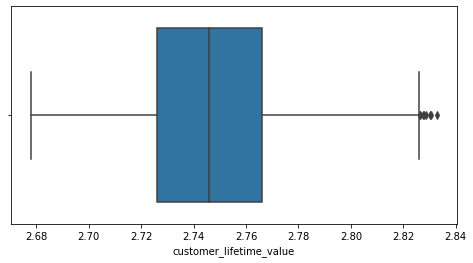

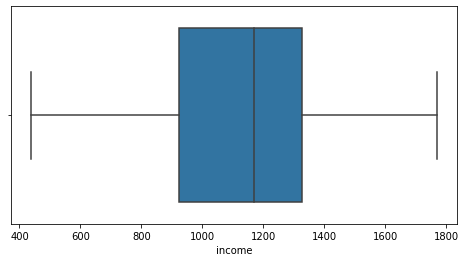

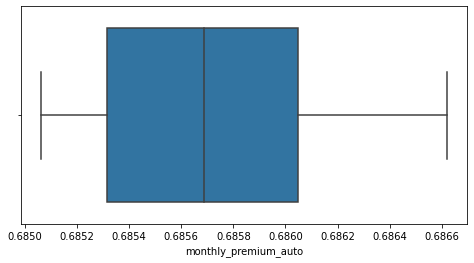

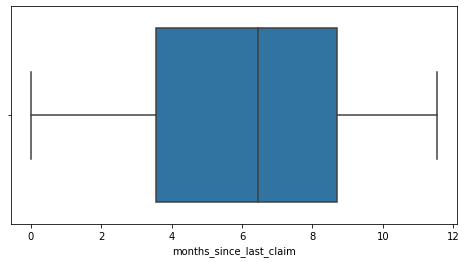

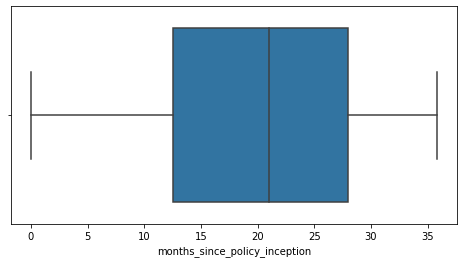

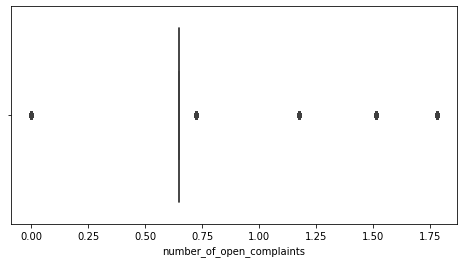

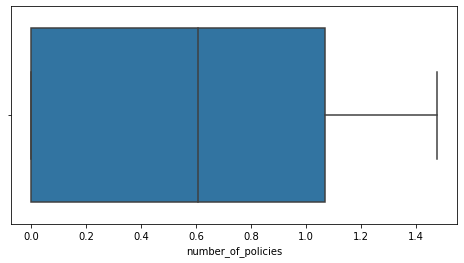

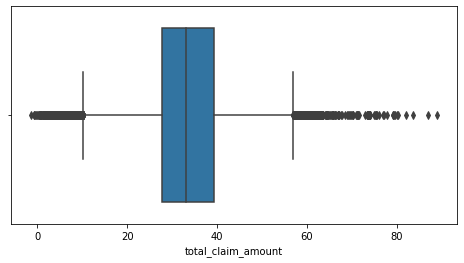

In [342]:
#check for outliers with boxplot 
for column in data.select_dtypes(np.number).columns:
    plt.figure(figsize=(8,4))
    sns.boxplot(x=data[column])
    plt.show()
#remove outliers in customer_lifetime_value, not in total_claim amount to dont mess up target value 

In [343]:
outliers = ['customer_lifetime_value']

for column in outliers:
    iqr = np.percentile(data[column],75) - np.percentile(data[column],25)
    upper_limit = np.percentile(data[column],75) + 1.5*iqr
    lower_limit = np.percentile(data[column],25) - 1.5*iqr
    data.loc[data[column] > upper_limit, column] = upper_limit
    data.loc[data[column] < lower_limit, column] = lower_limit

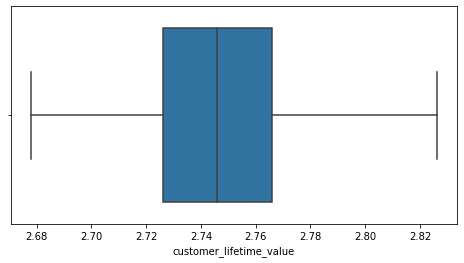

In [344]:
#check if outliers are removed
for checks in outliers:
    plt.figure(figsize=(8,4))
    sns.boxplot(x=data[checks])

## Processing Data

(Further processing...)

- X-y split. (done)
- Normalize (numerical). (done)
- One Hot/Label Encoding (categorical).
- Concat DataFrames

Normalizing, encoding
concatenate all the x variables
Its a good practice to normalize the target variable also, but only if you will do a linear regression or OLS, i.e. if the target variable is continous
Train/test split
Do lienar regression model

**X-Y Split** If you have not done it, you have you take in count that the target will be `total_claim_amount`

**Normalize (numerical)** If you have not done it yet, you can define a function using `StandardScaler`from sklearn library

In [345]:
# normalize + standardize the numericals, convert into dataframe and give column names
X_num = data.select_dtypes(include = np.number)

transformer = Normalizer().fit(X_num)
x_normalized = transformer.transform(X_num) #gives np array, with numerical data scaled down between 0 and 1
#print(x_normalized.shape)
data_no = pd.DataFrame(x_normalized) #transform in dataframe

transformer = StandardScaler().fit(data_no) #standardize the normalized dataframe data_no
x_standardized = transformer.transform(data_no) #gives array
data_no = pd.DataFrame(x_standardized) #convert into dataframe

no_col = ['customer_lifetime_value', 'income', 'monthly_premium_auto', 'months_since_last_claim', 'months_since_policy_inception', 'number_of_open_complaints', 'number_of_policies', 'total_claim_amount']

for idx, col in enumerate(no_col): #rename columns
    data_no.rename(columns={idx:col}, inplace=True)
data_no

#is it normal that there are negatives?

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,total_claim_amount
0,-0.526922,0.593991,-0.487962,0.757910,-1.486647,-0.203472,-1.046030,-0.332254
1,-0.301808,-0.460345,-0.309780,-0.245903,-0.263780,-0.096162,1.143796,1.016167
2,-0.215117,0.180254,-0.249292,0.143059,-0.341819,-0.059747,-0.092282,0.197584
3,-0.296199,0.097101,-0.307832,0.107742,0.302921,-0.095342,1.051185,0.083516
4,-0.105123,0.647392,-0.060304,-0.210047,-0.077027,0.056888,-1.046030,-0.842888
...,...,...,...,...,...,...,...,...
9129,-0.802916,0.577128,-0.848824,-0.218016,0.343646,-0.423653,-0.292492,-0.964252
9130,1.505419,-0.500263,1.565798,0.775949,0.055545,1.047269,-1.046030,0.938125
9131,-0.293529,-0.030228,-0.309330,-0.572969,-0.397086,1.287923,-0.111968,0.534535
9132,1.538436,-1.382094,1.520598,2.721038,-1.491532,1.018528,1.229852,1.913758


In [346]:
#do x,y split after normalizing all numericals incl. the target value
x = data_no.drop(['total_claim_amount'], axis=1)
y = data_no['total_claim_amount']

In [347]:
y

0      -0.332254
1       1.016167
2       0.197584
3       0.083516
4      -0.842888
          ...   
9129   -0.964252
9130    0.938125
9131    0.534535
9132    1.913758
9133   -0.255692
Name: total_claim_amount, Length: 9134, dtype: float64

In [348]:
x

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies
0,-0.526922,0.593991,-0.487962,0.757910,-1.486647,-0.203472,-1.046030
1,-0.301808,-0.460345,-0.309780,-0.245903,-0.263780,-0.096162,1.143796
2,-0.215117,0.180254,-0.249292,0.143059,-0.341819,-0.059747,-0.092282
3,-0.296199,0.097101,-0.307832,0.107742,0.302921,-0.095342,1.051185
4,-0.105123,0.647392,-0.060304,-0.210047,-0.077027,0.056888,-1.046030
...,...,...,...,...,...,...,...
9129,-0.802916,0.577128,-0.848824,-0.218016,0.343646,-0.423653,-0.292492
9130,1.505419,-0.500263,1.565798,0.775949,0.055545,1.047269,-1.046030
9131,-0.293529,-0.030228,-0.309330,-0.572969,-0.397086,1.287923,-0.111968
9132,1.538436,-1.382094,1.520598,2.721038,-1.491532,1.018528,1.229852


**One Hot/Label Encoding (categorical)** Try one of the two options learned in class

In [351]:
data

,customer,state,customer_lifetime_value,response,coverage,education,effective_to_date,employmentstatus,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size
0,BU79786,Washington,2.703839,No,Basic,Bachelor,2/24/11,Employed,F,1247.937066,Suburban,Married,0.685347,10.876059,3.017887,0.648045,0.000000,Corporate Auto,Corporate L3,Offer1,Agent,33.035752,Two-Door Car,Medsize
1,QZ44356,Arizona,2.754926,No,Extended,Bachelor,1/31/11,Unemployed,F,1167.961720,Suburban,Single,0.685871,5.808248,18.780377,0.648045,1.424359,Personal Auto,Personal L3,Offer3,Agent,56.357614,Four-Door Car,Medsize
2,AI49188,Nevada,2.780772,No,Premium,Bachelor,2/19/11,Employed,F,1144.063081,Suburban,Married,0.686039,7.347815,17.389171,0.648045,0.607328,Personal Auto,Personal L3,Offer1,Agent,40.071789,Two-Door Car,Medsize
3,WW63253,California,2.759125,No,Basic,Bachelor,1/20/11,Unemployed,M,1167.961720,Suburban,Married,0.686018,7.347815,26.160800,0.648045,1.363462,Corporate Auto,Corporate L2,Offer1,Call Center,38.763252,SUV,Medsize
4,HB64268,Washington,2.704995,No,Basic,Bachelor,2/3/11,Employed,M,1072.375744,Rural,Single,0.685461,5.471294,19.461641,0.648045,0.000000,Personal Auto,Personal L1,Offer1,Agent,19.560154,Four-Door Car,Medsize
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,California,2.801170,No,Basic,Bachelor,2/10/11,Employed,M,1448.531450,Urban,Married,0.685461,7.347815,33.090025,0.648045,0.607328,Personal Auto,Personal L1,Offer2,Web,23.588905,Four-Door Car,Medsize
9130,PK87824,California,2.711030,Yes,Extended,College,2/12/11,Employed,F,697.790558,Suburban,Divorced,0.685606,6.134207,13.709541,0.648045,0.000000,Corporate Auto,Corporate L3,Offer1,Branch,32.792951,Four-Door Car,Medsize
9131,TD14365,California,2.762062,No,Extended,Bachelor,2/6/11,Unemployed,M,1167.961720,Suburban,Single,0.685725,4.379465,17.034934,1.176115,0.607328,Corporate Auto,Corporate L2,Offer1,Branch,47.263726,Four-Door Car,Medsize
9132,UP19263,California,2.758397,No,Extended,College,2/3/11,Employed,M,704.383672,Suburban,Married,0.685898,11.319628,1.667871,0.648045,0.893486,Personal Auto,Personal L2,Offer3,Branch,44.225147,Four-Door Car,Large


In [352]:
X_cat = data.select_dtypes(include = object)

In [353]:
X_cat

,customer,state,response,coverage,education,effective_to_date,employmentstatus,gender,location_code,marital_status,policy_type,policy,renew_offer_type,sales_channel,vehicle_class,vehicle_size
0,BU79786,Washington,No,Basic,Bachelor,2/24/11,Employed,F,Suburban,Married,Corporate Auto,Corporate L3,Offer1,Agent,Two-Door Car,Medsize
1,QZ44356,Arizona,No,Extended,Bachelor,1/31/11,Unemployed,F,Suburban,Single,Personal Auto,Personal L3,Offer3,Agent,Four-Door Car,Medsize
2,AI49188,Nevada,No,Premium,Bachelor,2/19/11,Employed,F,Suburban,Married,Personal Auto,Personal L3,Offer1,Agent,Two-Door Car,Medsize
3,WW63253,California,No,Basic,Bachelor,1/20/11,Unemployed,M,Suburban,Married,Corporate Auto,Corporate L2,Offer1,Call Center,SUV,Medsize
4,HB64268,Washington,No,Basic,Bachelor,2/3/11,Employed,M,Rural,Single,Personal Auto,Personal L1,Offer1,Agent,Four-Door Car,Medsize
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,California,No,Basic,Bachelor,2/10/11,Employed,M,Urban,Married,Personal Auto,Personal L1,Offer2,Web,Four-Door Car,Medsize
9130,PK87824,California,Yes,Extended,College,2/12/11,Employed,F,Suburban,Divorced,Corporate Auto,Corporate L3,Offer1,Branch,Four-Door Car,Medsize
9131,TD14365,California,No,Extended,Bachelor,2/6/11,Unemployed,M,Suburban,Single,Corporate Auto,Corporate L2,Offer1,Branch,Four-Door Car,Medsize
9132,UP19263,California,No,Extended,College,2/3/11,Employed,M,Suburban,Married,Personal Auto,Personal L2,Offer3,Branch,Four-Door Car,Large


In [354]:
X_cat.columns

Index(['customer', 'state', 'response', 'coverage', 'education',
       'effective_to_date', 'employmentstatus', 'gender', 'location_code',
       'marital_status', 'policy_type', 'policy', 'renew_offer_type',
       'sales_channel', 'vehicle_class', 'vehicle_size'],
      dtype='object')

In [355]:
X_cat['marital_status'].value_counts()

Married     5298
Single      2467
Divorced    1369
Name: marital_status, dtype: int64

In [356]:
#get_dummies to check

cat_data = pd.get_dummies(X_cat, drop_first=True)
cat_data.shape


(9134, 9234)

In [357]:
#OneHot endoder and normalizer for numericals givs array
#Does it actually make sense to this this with all the categorical data since it gives almost 10000 columns? 
#How do I decide which categoricals to transform to numericals?


#use onehotencoder for categoricals and transform to array
#encoder = OneHotEncoder(handle_unknown='error', drop='first')
#encoder.fit(X_cat)
#encoded = encoder.transform(X_cat).toarray()
#encoded.shape
# How do I transform this into a dataframe with named columns?


#use pd.concat to join the new columns with your original dataframe
for column in X_cat.columns:
    X_cat = pd.concat([X_cat,pd.get_dummies(X_cat[column], prefix=column)],axis=1)
    # now drop the original column 
    X_cat.drop([column],axis=1, inplace=True)
    
X_cat

#this gives e.g. 3 columns for 3 values for column vehicle size (vehicle_size_Large',
# 'vehicle_size_Medsize', 'vehicle_size_Small), but only 2 were needed. Why is that?

,customer_AA10041,customer_AA11235,customer_AA16582,customer_AA30683,customer_AA34092,customer_AA35519,customer_AA56476,customer_AA69265,customer_AA71604,customer_AA93585,customer_AB13432,customer_AB21519,customer_AB23825,customer_AB26022,customer_AB31813,customer_AB45325,customer_AB60627,customer_AB62982,customer_AB69140,customer_AB72731,customer_AB73565,customer_AB78984,customer_AB96670,customer_AB98823,customer_AC13887,customer_AC22873,customer_AC24378,customer_AC40767,customer_AC42963,customer_AC58002,customer_AC67315,customer_AC73173,customer_AC75391,customer_AC79024,customer_AD12500,customer_AD18174,customer_AD28349,customer_AD28535,customer_AD33653,customer_AD33971,customer_AD38685,customer_AD56037,customer_AD63766,customer_AD71478,customer_AD89594,customer_AD95939,customer_AE23906,customer_AE30506,customer_AE60813,customer_AE62631,customer_AE74442,customer_AE89300,customer_AE90216,customer_AE93522,customer_AE98193,customer_AF10970,customer_AF17671,customer_AF20716,customer_AF36894,customer_AF37776,customer_AF41118,customer_AF47139,customer_AF48816,customer_AF49027,customer_AF49625,customer_AF69537,customer_AF81450,customer_AG22225,customer_AG32304,customer_AG39150,customer_AG45299,customer_AG47947,customer_AG56998,customer_AG58599,customer_AG62087,customer_AG62140,customer_AG85127,customer_AG85615,customer_AH17051,customer_AH22694,customer_AH39293,customer_AH41065,customer_AH41449,customer_AH53588,customer_AH55475,customer_AH58807,customer_AH65907,customer_AH84063,customer_AH89786,customer_AH92481,customer_AH97088,customer_AH99727,customer_AI11191,customer_AI14767,customer_AI16519,customer_AI47152,customer_AI49188,customer_AI49712,customer_AI58313,customer_AI58500,customer_AI61368,customer_AI74959,customer_AI85843,customer_AJ32539,customer_AJ58038,customer_AJ69060,customer_AJ69778,customer_AJ89107,customer_AJ89108,customer_AK11669,customer_AK11719,customer_AK17025,customer_AK44985,customer_AK46006,customer_AK54675,customer_AK59340,customer_AK61491,customer_AK72422,customer_AK90865,customer_AL21967,customer_AL27471,customer_AL35726,customer_AL43475,customer_AL43715,customer_AL46984,customer_AL50693,customer_AL78075,customer_AL95338,customer_AL96740,customer_AM17304,customer_AM26598,customer_AM26717,customer_AM28777,customer_AM29546,customer_AM30008,customer_AM32820,customer_AM34581,customer_AM36670,customer_AM52614,customer_AM53473,customer_AM57175,customer_AM72411,customer_AM79057,customer_AM88377,customer_AM89558,customer_AM92343,customer_AM94127,customer_AM97901,customer_AM99192,customer_AN21193,customer_AN32867,customer_AN36757,customer_AN47199,customer_AN53225,customer_AN57220,customer_AN67558,customer_AN79079,customer_AN80983,customer_AN97123,customer_AO20938,customer_AO40386,customer_AO42003,customer_AO46433,customer_AO74776,customer_AO77635,customer_AO87348,customer_AO98601,customer_AP23850,customer_AP27994,customer_AP32891,customer_AP34711,customer_AP46166,customer_AP47670,customer_AP52126,customer_AP52565,customer_AP56340,customer_AP59947,customer_AP63665,customer_AP65984,customer_AP66226,customer_AP67935,customer_AP89323,customer_AP90638,customer_AP95078,customer_AP98768,customer_AQ11656,customer_AQ25590,customer_AQ30231,customer_AQ34238,customer_AQ46199,customer_AQ51159,customer_AQ51368,customer_AQ52711,customer_AQ70385,customer_AQ70619,customer_AQ91207,customer_AQ94108,customer_AR17553,customer_AR25213,customer_AR40217,customer_AR47849,customer_AR59416,customer_AR61426,customer_AR63478,customer_AR69517,customer_AR75105,customer_AR83514,customer_AR96516,customer_AR99766,customer_AS17174,customer_AS18084,customer_AS26192,customer_AS48176,customer_AS55478,customer_AS55677,customer_AS60178,customer_AS62048,customer_AS77287,customer_AS78838,customer_AS93181,customer_AS97690,customer_AS99827,customer_AT13963,customer_AT18041,customer_AT24793,customer_AT26484,customer_AT29024,customer_AT30076,customer_AT31367,customer_AT33529,customer_AT36002,customer_AT41276,customer_AT49447,customer_AT52647,customer_AT55072,cust

In [358]:
X_cat.columns

Index(['customer_AA10041', 'customer_AA11235', 'customer_AA16582',
       'customer_AA30683', 'customer_AA34092', 'customer_AA35519',
       'customer_AA56476', 'customer_AA69265', 'customer_AA71604',
       'customer_AA93585',
       ...
       'sales_channel_Web', 'vehicle_class_Four-Door Car',
       'vehicle_class_Luxury Car', 'vehicle_class_Luxury SUV',
       'vehicle_class_SUV', 'vehicle_class_Sports Car',
       'vehicle_class_Two-Door Car', 'vehicle_size_Large',
       'vehicle_size_Medsize', 'vehicle_size_Small'],
      dtype='object', length=9250)

**Concat DataFrames**

In [359]:
#concacenate arrays

#data_N = np.concatenate([x_standardized, encoded], axis=1)  # using normalized and one-hot encoded data
#data_N.shape



(9134, 9242)

In [360]:
#concacenate dataframes 
data_F = pd.concat([X_cat, data_no], axis=1)  # using normalized and one-hot encoded data
data_F

,customer_AA10041,customer_AA11235,customer_AA16582,customer_AA30683,customer_AA34092,customer_AA35519,customer_AA56476,customer_AA69265,customer_AA71604,customer_AA93585,customer_AB13432,customer_AB21519,customer_AB23825,customer_AB26022,customer_AB31813,customer_AB45325,customer_AB60627,customer_AB62982,customer_AB69140,customer_AB72731,customer_AB73565,customer_AB78984,customer_AB96670,customer_AB98823,customer_AC13887,customer_AC22873,customer_AC24378,customer_AC40767,customer_AC42963,customer_AC58002,customer_AC67315,customer_AC73173,customer_AC75391,customer_AC79024,customer_AD12500,customer_AD18174,customer_AD28349,customer_AD28535,customer_AD33653,customer_AD33971,customer_AD38685,customer_AD56037,customer_AD63766,customer_AD71478,customer_AD89594,customer_AD95939,customer_AE23906,customer_AE30506,customer_AE60813,customer_AE62631,customer_AE74442,customer_AE89300,customer_AE90216,customer_AE93522,customer_AE98193,customer_AF10970,customer_AF17671,customer_AF20716,customer_AF36894,customer_AF37776,customer_AF41118,customer_AF47139,customer_AF48816,customer_AF49027,customer_AF49625,customer_AF69537,customer_AF81450,customer_AG22225,customer_AG32304,customer_AG39150,customer_AG45299,customer_AG47947,customer_AG56998,customer_AG58599,customer_AG62087,customer_AG62140,customer_AG85127,customer_AG85615,customer_AH17051,customer_AH22694,customer_AH39293,customer_AH41065,customer_AH41449,customer_AH53588,customer_AH55475,customer_AH58807,customer_AH65907,customer_AH84063,customer_AH89786,customer_AH92481,customer_AH97088,customer_AH99727,customer_AI11191,customer_AI14767,customer_AI16519,customer_AI47152,customer_AI49188,customer_AI49712,customer_AI58313,customer_AI58500,customer_AI61368,customer_AI74959,customer_AI85843,customer_AJ32539,customer_AJ58038,customer_AJ69060,customer_AJ69778,customer_AJ89107,customer_AJ89108,customer_AK11669,customer_AK11719,customer_AK17025,customer_AK44985,customer_AK46006,customer_AK54675,customer_AK59340,customer_AK61491,customer_AK72422,customer_AK90865,customer_AL21967,customer_AL27471,customer_AL35726,customer_AL43475,customer_AL43715,customer_AL46984,customer_AL50693,customer_AL78075,customer_AL95338,customer_AL96740,customer_AM17304,customer_AM26598,customer_AM26717,customer_AM28777,customer_AM29546,customer_AM30008,customer_AM32820,customer_AM34581,customer_AM36670,customer_AM52614,customer_AM53473,customer_AM57175,customer_AM72411,customer_AM79057,customer_AM88377,customer_AM89558,customer_AM92343,customer_AM94127,customer_AM97901,customer_AM99192,customer_AN21193,customer_AN32867,customer_AN36757,customer_AN47199,customer_AN53225,customer_AN57220,customer_AN67558,customer_AN79079,customer_AN80983,customer_AN97123,customer_AO20938,customer_AO40386,customer_AO42003,customer_AO46433,customer_AO74776,customer_AO77635,customer_AO87348,customer_AO98601,customer_AP23850,customer_AP27994,customer_AP32891,customer_AP34711,customer_AP46166,customer_AP47670,customer_AP52126,customer_AP52565,customer_AP56340,customer_AP59947,customer_AP63665,customer_AP65984,customer_AP66226,customer_AP67935,customer_AP89323,customer_AP90638,customer_AP95078,customer_AP98768,customer_AQ11656,customer_AQ25590,customer_AQ30231,customer_AQ34238,customer_AQ46199,customer_AQ51159,customer_AQ51368,customer_AQ52711,customer_AQ70385,customer_AQ70619,customer_AQ91207,customer_AQ94108,customer_AR17553,customer_AR25213,customer_AR40217,customer_AR47849,customer_AR59416,customer_AR61426,customer_AR63478,customer_AR69517,customer_AR75105,customer_AR83514,customer_AR96516,customer_AR99766,customer_AS17174,customer_AS18084,customer_AS26192,customer_AS48176,customer_AS55478,customer_AS55677,customer_AS60178,customer_AS62048,customer_AS77287,customer_AS78838,customer_AS93181,customer_AS97690,customer_AS99827,customer_AT13963,customer_AT18041,customer_AT24793,customer_AT26484,customer_AT29024,customer_AT30076,customer_AT31367,customer_AT33529,customer_AT36002,customer_AT41276,customer_AT49447,customer_AT52647,customer_AT55072,cust

## Linear Regression

- Train-test split.
- Apply linear regression.

**Train-test split** Divide your data in a train part and a test part

In [361]:
y

0      -0.332254
1       1.016167
2       0.197584
3       0.083516
4      -0.842888
          ...   
9129   -0.964252
9130    0.938125
9131    0.534535
9132    1.913758
9133   -0.255692
Name: total_claim_amount, Length: 9134, dtype: float64

In [363]:
data_F

,customer_AA10041,customer_AA11235,customer_AA16582,customer_AA30683,customer_AA34092,customer_AA35519,customer_AA56476,customer_AA69265,customer_AA71604,customer_AA93585,customer_AB13432,customer_AB21519,customer_AB23825,customer_AB26022,customer_AB31813,customer_AB45325,customer_AB60627,customer_AB62982,customer_AB69140,customer_AB72731,customer_AB73565,customer_AB78984,customer_AB96670,customer_AB98823,customer_AC13887,customer_AC22873,customer_AC24378,customer_AC40767,customer_AC42963,customer_AC58002,customer_AC67315,customer_AC73173,customer_AC75391,customer_AC79024,customer_AD12500,customer_AD18174,customer_AD28349,customer_AD28535,customer_AD33653,customer_AD33971,customer_AD38685,customer_AD56037,customer_AD63766,customer_AD71478,customer_AD89594,customer_AD95939,customer_AE23906,customer_AE30506,customer_AE60813,customer_AE62631,customer_AE74442,customer_AE89300,customer_AE90216,customer_AE93522,customer_AE98193,customer_AF10970,customer_AF17671,customer_AF20716,customer_AF36894,customer_AF37776,customer_AF41118,customer_AF47139,customer_AF48816,customer_AF49027,customer_AF49625,customer_AF69537,customer_AF81450,customer_AG22225,customer_AG32304,customer_AG39150,customer_AG45299,customer_AG47947,customer_AG56998,customer_AG58599,customer_AG62087,customer_AG62140,customer_AG85127,customer_AG85615,customer_AH17051,customer_AH22694,customer_AH39293,customer_AH41065,customer_AH41449,customer_AH53588,customer_AH55475,customer_AH58807,customer_AH65907,customer_AH84063,customer_AH89786,customer_AH92481,customer_AH97088,customer_AH99727,customer_AI11191,customer_AI14767,customer_AI16519,customer_AI47152,customer_AI49188,customer_AI49712,customer_AI58313,customer_AI58500,customer_AI61368,customer_AI74959,customer_AI85843,customer_AJ32539,customer_AJ58038,customer_AJ69060,customer_AJ69778,customer_AJ89107,customer_AJ89108,customer_AK11669,customer_AK11719,customer_AK17025,customer_AK44985,customer_AK46006,customer_AK54675,customer_AK59340,customer_AK61491,customer_AK72422,customer_AK90865,customer_AL21967,customer_AL27471,customer_AL35726,customer_AL43475,customer_AL43715,customer_AL46984,customer_AL50693,customer_AL78075,customer_AL95338,customer_AL96740,customer_AM17304,customer_AM26598,customer_AM26717,customer_AM28777,customer_AM29546,customer_AM30008,customer_AM32820,customer_AM34581,customer_AM36670,customer_AM52614,customer_AM53473,customer_AM57175,customer_AM72411,customer_AM79057,customer_AM88377,customer_AM89558,customer_AM92343,customer_AM94127,customer_AM97901,customer_AM99192,customer_AN21193,customer_AN32867,customer_AN36757,customer_AN47199,customer_AN53225,customer_AN57220,customer_AN67558,customer_AN79079,customer_AN80983,customer_AN97123,customer_AO20938,customer_AO40386,customer_AO42003,customer_AO46433,customer_AO74776,customer_AO77635,customer_AO87348,customer_AO98601,customer_AP23850,customer_AP27994,customer_AP32891,customer_AP34711,customer_AP46166,customer_AP47670,customer_AP52126,customer_AP52565,customer_AP56340,customer_AP59947,customer_AP63665,customer_AP65984,customer_AP66226,customer_AP67935,customer_AP89323,customer_AP90638,customer_AP95078,customer_AP98768,customer_AQ11656,customer_AQ25590,customer_AQ30231,customer_AQ34238,customer_AQ46199,customer_AQ51159,customer_AQ51368,customer_AQ52711,customer_AQ70385,customer_AQ70619,customer_AQ91207,customer_AQ94108,customer_AR17553,customer_AR25213,customer_AR40217,customer_AR47849,customer_AR59416,customer_AR61426,customer_AR63478,customer_AR69517,customer_AR75105,customer_AR83514,customer_AR96516,customer_AR99766,customer_AS17174,customer_AS18084,customer_AS26192,customer_AS48176,customer_AS55478,customer_AS55677,customer_AS60178,customer_AS62048,customer_AS77287,customer_AS78838,customer_AS93181,customer_AS97690,customer_AS99827,customer_AT13963,customer_AT18041,customer_AT24793,customer_AT26484,customer_AT29024,customer_AT30076,customer_AT31367,customer_AT33529,customer_AT36002,customer_AT41276,customer_AT49447,customer_AT52647,customer_AT55072,cust

In [364]:
# traint-test split: y = normalized
X_train, X_test, y_train, y_test = train_test_split(data_F, y, test_size=0.3, random_state=42)


In [365]:
model = LinearRegression()
model.fit(X_train,y_train)

LinearRegression()

In [366]:
predictions  = model.predict(X_test)
predictions.shape

(2741,)

**Apply linear regression** For this question you can use `statsmodels` or `sklearn` libraries

## Model Validation

- Description:
R2.
MSE.
RMSE.
MAE.

**Get R2 from the model**

In [367]:
r2 = r2_score(y_test, predictions)
print("R2:", r2)

#can this be? 99% ?

R2: 0.9999993255877403


**Get MSE from the model**

In [368]:
mse = mean_squared_error(y_test, predictions, squared=True)
print("MSE:", mse)

MSE: 6.692479174927685e-07


**Get RMSE from the model**

In [369]:
rmse = mean_squared_error(y_test, predictions, squared=False)
print("RMSE:", rmse)

RMSE: 0.0008180757406822234


**Get MAE from the model**

In [370]:
mae = mean_absolute_error(y_test, predictions)
print("MAE:", mse)

MAE: 6.692479174927685e-07
